In [2]:
#pip install wordcloud

     |████████████████████████████████| 160 kB 3.4 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns 
from sklearn.preprocessing import normalize
from scipy.spatial.distance import cosine, euclidean, hamming
from wordcloud import WordCloud,STOPWORDS
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, homogeneity_score, calinski_harabasz_score
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
stopwords = set(STOPWORDS)

## Class Diagram

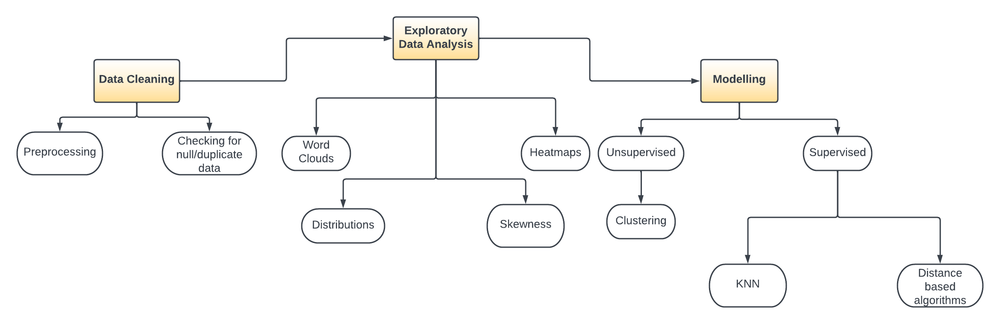

In [3]:
# data = pd.read_csv('/content/drive/MyDrive/Capstone/MusicRecommendation/data.csv')
data = pd.read_csv('data/data.csv')
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


#### Data clean

In [4]:
data['artists'] = data['artists'].map(lambda x: x.lstrip('[').rstrip(']'))
data['artists'] = data['artists'].map(lambda x: x[1:-1])
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"Sergei Rachmaninoff', 'James Levine', 'Berline...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,Dennis Day,0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,Frank Parker,0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,Phil Regan,0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [5]:
data['year'] = data['year'].astype(int)

In [6]:
data['song_id']=data.index
df = data[['danceability','energy',"valence","speechiness","instrumentalness","acousticness"]]
df.index = data['song_id']
# normalized  data by columns
df_normalized = pd.DataFrame(normalize(df, axis=1))
df_normalized.columns = df.columns
df_normalized.index = df.index
df_normalized.head()

,danceability,energy,valence,speechiness,instrumentalness,acousticness
song_id,,,,,,
0,0.204439,0.154611,0.043526,0.026819,0.643359,0.719566
1,0.526206,0.219092,0.618725,0.266637,0.000000,0.470308
2,0.238274,0.120590,0.028622,0.024627,0.663245,0.698114
3,0.258165,0.290084,0.154899,0.033233,0.000026,0.907802
4,0.382654,0.176680,0.231606,0.034787,0.000002,0.876076


In [7]:
# genre_data = pd.read_csv('/content/drive/MyDrive/Capstone/MusicRecommendation/data_by_genres.csv')
# year_data = pd.read_csv('/content/drive/MyDrive/Capstone/MusicRecommendation/data_by_year.csv')
# artists_data = pd.read_csv('/content/drive/MyDrive/Capstone/MusicRecommendation/data_by_artist.csv')
genre_data = pd.read_csv('data/data_by_genres.csv')
year_data = pd.read_csv('data/data_by_year.csv')
artists_data = pd.read_csv('data/data_by_artist.csv')

In [8]:
genre_data.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


Let us now take a look at how some variables look/ vary like

<AxesSubplot:xlabel='danceability', ylabel='Count'>

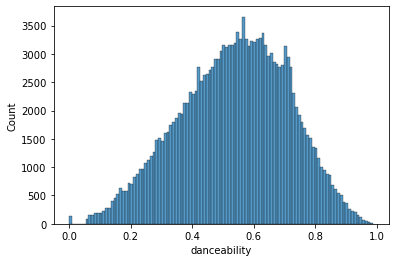

In [9]:
# Plot a histogram of the danceability distribution
sns.histplot(data['danceability'], kde=False)

<AxesSubplot:xlabel='energy', ylabel='loudness'>

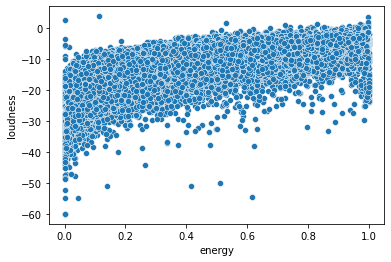

In [10]:
# Plot a scatterplot of energy vs. loudness
sns.scatterplot(x='energy', y='loudness', data=data)

<AxesSubplot:xlabel='key', ylabel='energy'>

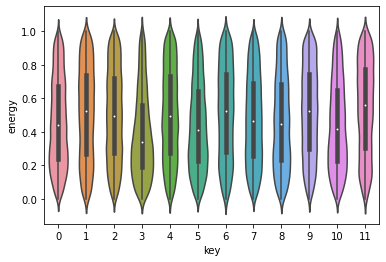

In [11]:
sns.violinplot(x='key', y='energy', data=data)

<AxesSubplot:xlabel='decade', ylabel='count'>

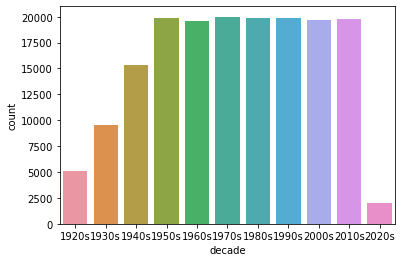

In [12]:
# Creating a new 'decade' column based on the 'year' column
data['decade'] = data['year'].apply(lambda year: f'{(year // 10) * 10}s')
data['decade'] = pd.Categorical(data['decade'])

sns.countplot(data=data, x='decade')

In [14]:
comment_words = " ".join(genre_data['genres'])+" "
wordcloud = WordCloud(width = 800, height = 800,background_color ='white',stopwords = stopwords,max_words=50,min_font_size = 5).generate(comment_words)
                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Genres Wordcloud")
plt.show()

ValueError: Only supported for TrueType fonts

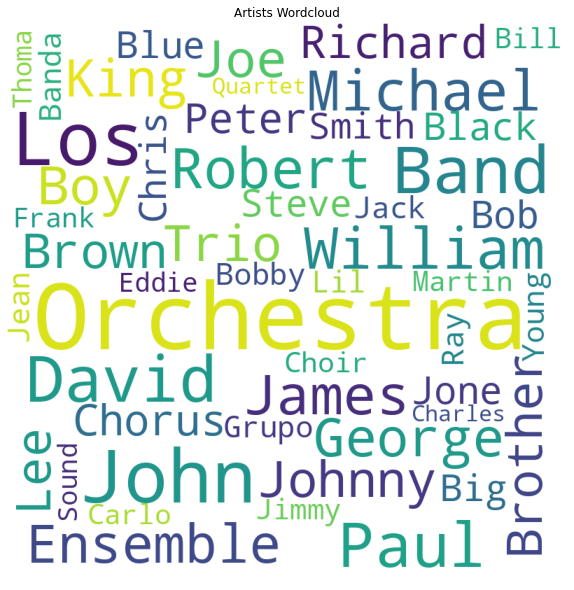

In [ ]:
comment_words = " ".join(artists_data['artists'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_word_length=3,
                max_words=50,
                min_font_size = 5).generate(comment_words)
                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Artists Wordcloud")
plt.tight_layout(pad = 0)
plt.show()

In [ ]:
# Calculate the mean popularity score for each decade
popularity_by_decade = data.groupby('decade')['popularity'].mean().reset_index()

# Create an interactive bar chart of the mean popularity score by decade
fig = px.bar(popularity_by_decade, x='decade', y='popularity', color='decade')
fig.show()

In [ ]:
# Preprocess the data
data.drop_duplicates(inplace=True)
data.dropna(inplace=True)

In [ ]:
# Extract relevant features using TF-IDF
tfidf = TfidfVectorizer(stop_words='english')
features = tfidf.fit_transform(data['name'])

In [ ]:
# Train the model
model = NearestNeighbors(metric='cosine', algorithm='brute')
model.fit(features)

NearestNeighbors(algorithm='brute', metric='cosine')

In [ ]:
# Generate recommendations
user_history = [data['name'][8], data['name'][7]]
user_features = tfidf.transform(user_history)
distances, indices = model.kneighbors(user_features, n_neighbors=5)

for i in range(len(indices)):
    print(f"Recommendations for {user_history[i]}:")
    for j in indices[i][1:]:
        print(data.iloc[j]['name'])
    print()

Recommendations for La Mañanita - Remasterizado:
S.O.S. - Remasterizado
Always - Remasterizado
Please - Remasterizado
La La La

Recommendations for Morceaux de fantaisie, Op. 3: No. 2, Prélude in C-Sharp Minor. Lento:
Morceaux de fantaisie, Op. 3: No. 2, Prélude in C-Sharp Minor. Lento
5 Morceaux de fantaisie, Op. 3: No. 2 Prelude in C-Sharp Minor
Prélude in C sharp minor, Op.3, No.2
Prélude in C-Sharp Minor, Op. 45



This code generates recommendations for a given user, based on their listening history. The kneighbors method returns the indices of the most similar songs in the dataset, as well as their distances from the user's listening history. The code then prints out the top 4 recommendations for each song in the user's listening history.

Note that this is a very basic implementation of a music recommendation system, and there are many ways to improve its accuracy and effectiveness. 



## Clustering

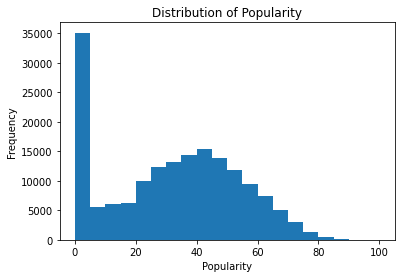

In [ ]:
# To understand the popularity distribution

#popularity column from the X dataframe
popularity = data['popularity']

#Plot a histogram of the popularity distribution
plt.hist(popularity, bins=20)

plt.title('Distribution of Popularity')
plt.xlabel('Popularity')
plt.ylabel('Frequency')

plt.show()


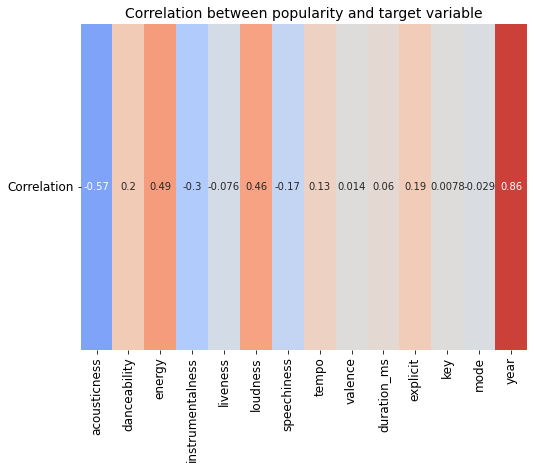

In [ ]:
#to understand the correlation between popularity and other features

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
                 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'duration_ms',
                 'explicit', 'key', 'mode', 'year']

X, y = data[feature_names], data['popularity']

#correlation between features and target variable
corr = X.corrwith(y)

corr_df = pd.DataFrame(corr, columns=['Correlation'])

# Plot the correlation values
plt.figure(figsize=(8, 6))
sns.heatmap(corr_df.transpose(), cmap="coolwarm", annot=True, vmin=-1, vmax=1, cbar=False)

plt.title('Correlation between popularity and target variable', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)

plt.show()


Clustering genres

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

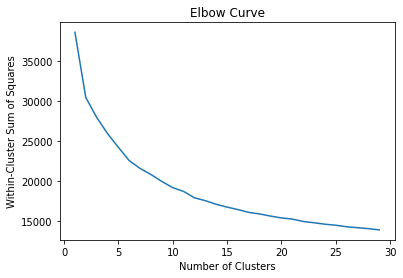

In [ ]:
#finding optimal number clusters for genres using elbow curve

#numerical features and scale them
X = genre_data.select_dtypes(np.number)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#wcss for different number of clusters
wcss = []
for i in range(1, 30):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

#plot the elbow curve
plt.plot(range(1, 30), wcss)
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.show()

In [ ]:
#performing actual clustering

#standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(genre_data.select_dtypes(np.number))

#cluster the data
kmeans = KMeans(n_clusters=10)
labels = kmeans.fit_predict(X_scaled)
genre_data['cluster'] = labels

genre_data

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,cluster
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6,7
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5,8
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7,3
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7,4
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,1,zolo,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943,9,2
2969,0,zouglou,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000,7,5
2970,1,zouk,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667,5,3
2971,0,zurich indie,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000,7,4


In [ ]:
#reduce the dimensionality of the data
tsne = TSNE(n_components=2, verbose=1)
embedding = tsne.fit_transform(X_scaled)
projection = pd.DataFrame({'x': embedding[:, 0], 'y': embedding[:, 1], 'genres': genre_data['genres'], 'cluster': labels})

#visualize the results
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.006s...
[t-SNE] Computed neighbors for 2973 samples in 0.307s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106354
[t-SNE] KL divergence after 1000 iterations: 1.391472


In [ ]:
#Performance evaluation of clusters

#evaluate the performance of the clustering algorithm
silhouette = silhouette_score(X_scaled, labels)
homogeneity = homogeneity_score(genre_data['genres'], labels)

print(f"Silhouette score: {silhouette:.3f}")
print(f"Homogeneity score: {homogeneity:.3f}")

Silhouette score: 0.124
Homogeneity score: 0.249


Clustering songs

In [ ]:
#creating pipeline for clustering
song_cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('kmeans', KMeans(verbose=False))
])

#numerical columns from data
X = data.select_dtypes(np.number)

#fit pipeline and predict clusters
song_cluster_pipeline.set_params(kmeans__n_clusters=20)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

data

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,...,loudness,mode,name,popularity,release_date,speechiness,tempo,song_id,decade,cluster_label
0,0.0594,1921,0.98200,"Sergei Rachmaninoff', 'James Levine', 'Berline...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,...,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,0,1920s,16
1,0.9630,1921,0.73200,Dennis Day,0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,...,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,1,1920s,11
2,0.0394,1921,0.96100,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,...,-14.850,1,Gati Bali,5,1921,0.0339,110.339,2,1920s,16
3,0.1650,1921,0.96700,Frank Parker,0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,...,-9.316,1,Danny Boy,3,1921,0.0354,100.109,3,1920s,6
4,0.2530,1921,0.95700,Phil Regan,0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,...,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,4,1920s,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,"Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna',...",0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,...,-3.702,1,China,72,2020-05-29,0.0881,105.029,170648,2020s,14
170649,0.7340,2020,0.20600,Ashnikko,0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,...,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,170649,2020s,14
170650,0.6370,2020,0.10100,MAMAMOO,0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,...,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,170650,2020s,0
170651,0.1950,2020,0.00998,Eminem,0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,...,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,170651,2020s,5


In [ ]:
# Visualize clusters with PCA
pca_pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('PCA', PCA(n_components=2))
])

song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

##### Content based solution

In [ ]:
"""
Content based solution
The results based on different distance calculation approaches

df_normalized: normalized song data
distance_method: distance calculation approach: e.g. cosine, euclidean, hamming
song_id: find similar songs based on the selected song
N: Top N song(s)

return args:
1) song data of selected spng and Top N recommendation, 
2) song id and song name of Top N recommendation
"""

def Content_filter_music_recommender(song_id, N):
    distance_method = cosine
    allSongs = pd.DataFrame(df_normalized.index)
    allSongs = allSongs[allSongs.song_id != song_id]
    allSongs["distance"] = allSongs["song_id"].apply(lambda x: distance_method(df_normalized.loc[song_id], df_normalized.loc[x]))
    # sort by distance then recipe id, the smaller value of recipe id will be picked. 
    TopNRecommendation = allSongs.sort_values(["distance"]).head(N).sort_values(by=['distance', 'song_id'])
    #print(data['name'].loc[song_id, :])
    Recommendation = pd.merge(TopNRecommendation , data, how='inner', on='song_id')
    SongName = Recommendation['name']
    return SongName

 - ML based way 

In [ ]:
#data['song_id']=data.index
df2 = data[['danceability','energy',"valence","speechiness","instrumentalness","acousticness"]]
df2.index = data['song_id']
# df2X = df2[]
df2Pop = data["popularity"]

In [ ]:
#split the data into 80% training and 20% testing
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(df2,df2Pop, test_size=0.20,random_state=0)


In [ ]:
# create and train the Linear regression
from sklearn.linear_model import LinearRegression
clf = LinearRegression()
clf.fit(xtrain,ytrain)
clf.score(xtest,ytest)

0.42709562540894774

Neighbourhood Based Collaborative Filterng Reccomendation System using Manhattan Distance

In [ ]:
df3 = data.drop(labels=['id', 'release_date'], axis=1)

In [ ]:
def normalize_column(col):
    """
    col - column in the dataframe which needs to be normalized
    """
    max_d = df3[col].max()
    min_d = df3[col].min()
    df3[col] = (df3[col] - min_d)/(max_d - min_d)

In [ ]:
#Normalize all numerical columns so that min value is 0 and max value is 1
num_types = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num = df3.select_dtypes(include=num_types)
        
for col in num.columns:
    normalize_column(col)

In [ ]:
km = KMeans(n_clusters=25)
pred = km.fit_predict(num)
df3['pred'] = pred
normalize_column('pred')


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
df3.drop(['decade'],axis=1,inplace=True)

In [ ]:
from tqdm import tqdm

class Song_Recommender():
    """
    Neighbourhood Based Collborative Filterng Recommendation System using similarity Metrics
    Manhattan Distance is calculated for all songs and Recommend Songs that are similar to it based on any given song
    """
    def __init__(self, data):
        self.data_ = data
    
    #function which returns recommendations, we can also choose the amount of songs to be recommended
    def get_recommendations(self, song_name, n_top):
        distances = []
        #choosing the given song_name and dropping it from the data
        song = self.data_[(self.data_.name.str.lower() == song_name.lower())].head(1).values[0]
        rem_data = self.data_[self.data_.name.str.lower() != song_name.lower()]
        for r_song in tqdm(rem_data.values):
            dist = 0
            for col in np.arange(len(rem_data.columns)):
                #indices of non-numerical columns(id,Release date,name,artists)
                if not col in [3,7,13]:
                    #calculating the manhattan distances for each numerical feature
                    dist = dist + np.absolute(float(song[col]) - float(r_song[col]))
            distances.append(dist)
        rem_data['distance'] = distances
        #sorting our data to be ascending by 'distance' feature
        rem_data = rem_data.sort_values('distance')
        columns = ['artists', 'name']
        return rem_data[columns][:n_top]


In [ ]:
#Instanstiate the Recommender Class
recommender = Song_Recommender(df3)
recommender.get_recommendations('Red Roses (feat. Landon Cube)', 5)

100%|██████████| 170652/170652 [00:10<00:00, 16652.96it/s]
<ipython-input-40-c1b323213a86>:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,artists,name
38190,"Maroon 5', 'Cardi B",Girls Like You (feat. Cardi B)
38257,"Post Malone', 'Halsey', 'Future",Die For Me (feat. Future & Halsey)
57027,"Vince Staples', '6LACK', 'Mereba","Yo Love - From ""Queen & Slim: The Soundtrack"""
56966,"Maroon 5', 'Cardi B",Girls Like You (feat. Cardi B)
18646,"Meghan Trainor', 'John Legend",Like I'm Gonna Lose You (feat. John Legend)


In [ ]:
recommender.get_recommendations('canon in d', 10)

100%|██████████| 170648/170648 [00:08<00:00, 19453.95it/s]
<ipython-input-40-c1b323213a86>:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,artists,name
72203,Patrick Doyle,Neville's Waltz
89071,Jon Brion,"Theme - From ""Eternal Sunshine of the Spotless..."
89559,Jeremy Soule,All's Well
73672,The 1975,Me
89339,"Frédéric Chopin', 'Gabriela Montero","Chopin: Nocturne No. 8 in D-Flat Major, Op. 27..."
88184,Explosions In The Sky,Remember Me As A Time Of Day - Remastered
105042,Yiruma,Passing By
86612,Joe Hisaishi,Bygone Days
71165,David Bauer,As the Deer
107461,Lavinia Meijer,Due tramonti


In [ ]:
recommender.get_recommendations('dynamite', 10)

100%|██████████| 170646/170646 [00:09<00:00, 17935.32it/s]
<ipython-input-40-c1b323213a86>:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,artists,name
18017,One Direction,What Makes You Beautiful
36728,Bowling For Soup,Stacy's Mom
17818,Hot Chelle Rae,Tonight Tonight
18192,Katy Perry,Part Of Me
17237,Katy Perry,I Kissed A Girl
18076,Bridgit Mendler,Ready or Not
18735,Little Mix,Black Magic
17119,"Mark Ronson', 'Amy Winehouse",Valerie (feat. Amy Winehouse) - Version Revisited
17439,Brooks & Dunn,My Maria
17225,Lady Gaga,Poker Face
